1. Importation des packages

In [1]:
import os
import random
import pandas as pd
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [2]:
train_dir = "dogs-vs-cats/train"
test_dir = "dogs-vs-cats/test"

train_files = os.listdir(train_dir)
test_files = os.listdir(test_dir)

#création DataFrame train
train_labels = []

for file in train_files:
    if file.startswith("dog"):
        train_labels.append(1)  #chien = 1 
    else:
        train_labels.append(0)  #chien = 0
train_df = pd.DataFrame({
    "filename": train_files,
    "class":train_labels
})

#créacréation DataFrame train
test_labels = []

for file in test_files:
    if file.startswith("dog"):
        test_labels.append(1)    
    else:
        test_labels.append(0)

test_df = pd.DataFrame({
    "filename": test_files,
    "class": test_labels
})    

In [3]:
noms_fichiers = os.listdir(train_dir)
# Initialiser une liste pour les catégories
categories = []

# Boucle pour assigner les categories
for filename in noms_fichiers:
    # Obtenir la partie avant le premier point du nom de fivhier
    categorie = filename.split('.')[0]
    #Vérifier si cette partie est "dog"
    if categorie == 'dog':
        # Ajouter 1 à la liste categories (indiquant que c'est une image de chien)
        categories.append(1)
    else:
        # Ajouter 0 à la liste categories (indiquant que c'est une image de chat)
        categories.append(0)

In [4]:
# Créer un DataFrame avec pandas
df = pd.DataFrame({
    'filename': noms_fichiers,
    'category': categories
})

# Afficher le DataFrame
print(df.head())

       filename  category
0     cat.0.jpg         0
1     cat.1.jpg         0
2    cat.10.jpg         0
3   cat.100.jpg         0
4  cat.1000.jpg         0


In [5]:
# Créer un graphique en nombre des catégories
compte_categories = df['category'].value_counts()
noms_categories = ['chien', 'chat']
compte_categories

category
0    12501
1    12500
Name: count, dtype: int64

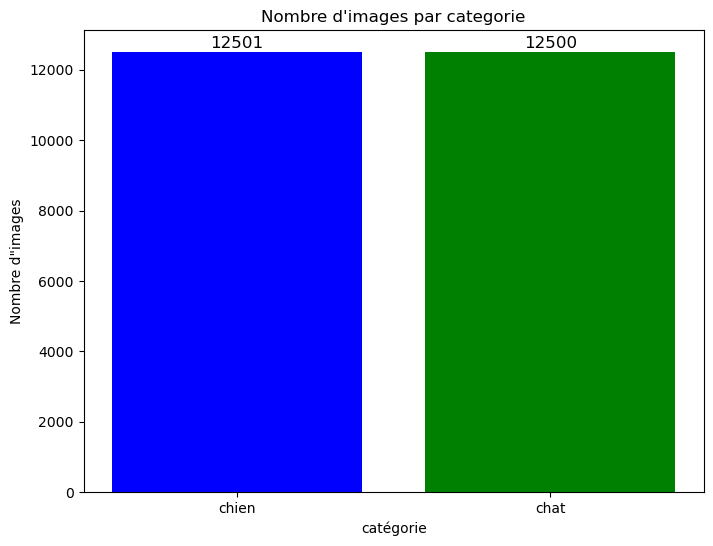

In [6]:
plt.figure(figsize=(8, 6))
couleurs = ['blue', 'green'] # Couleus compréhensibles
plt.bar(noms_categories, compte_categories, color=couleurs)
plt.xlabel('catégorie')
plt.ylabel('Nombre d\"images')
plt.title('Nombre d\'images par categorie')
for i, v in enumerate(compte_categories):
    plt.text(i, v + 50, str(v), ha='center', va='bottom', fontsize=12, color='black')
    

In [7]:
# Sélectionner une image aléatoire
# Sélectionner une image aléatoire
image_aleatoire = random.choice(noms_fichiers)

# Chemin complet de l'image sélectionnée
img_path = os.path.join(train_dir, image_aleatoire)
img_path

'dogs-vs-cats/train\\dog.4127.jpg'

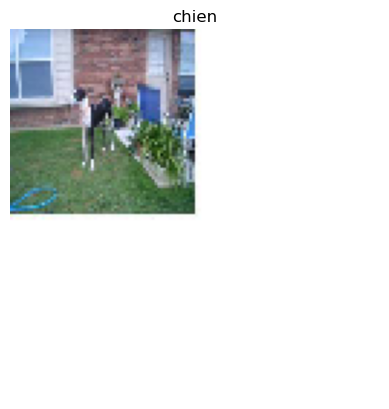

In [8]:
# Changer et afficher l'image
img = image.load_img(img_path, target_size=(128, 128))
plt.imshow(img)
categorie = 'chien' if 'dog' in image_aleatoire else 'chat'
plt.title(categorie)
plt.axis('off')
plt.show()

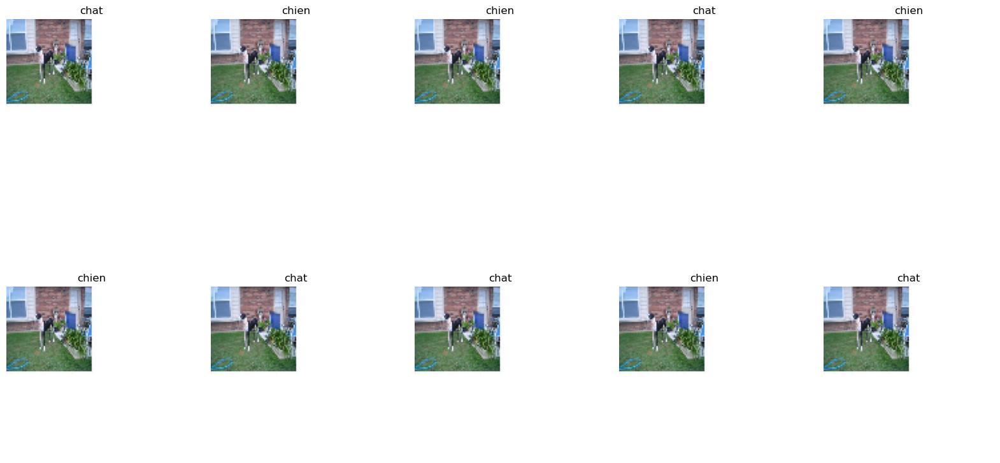

In [9]:
from tensorflow.keras.preprocessing import image
# Sélectionner 10 images aléatoires
random_images = df.sample(n=10)

# Afficher les 10 images aléatoires
plt.figure(figsize=(20, 10))

for i, row in enumerate(random_images.iterrows()):
    filename = row[1]['filename']
    category = 'chien' if row[1]['category'] == 1 else 'chat'
    img_peth = os.path.join(train_dir, filename)
    img = image.load_img(img_path, target_size=(128, 128))
    plt.subplot(2, 5, i+1)
    plt.imshow(img)
    plt.title(category)
    plt.axis('off')

plt.show()

In [10]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt

In [11]:
train_datagen = ImageDataGenerator(
    rescale=1./255, # Ré-échelle les valeurs des pixels entre 0 et 255 à l'intervall
    validation_split=0.2 # 20% des données pour la validation
)

In [12]:
# Sélectionner aléatoirement 1500 images de chats (catégorie 0)
chats_df = df[df['category'] == 0].sample(n=1500, random_state=42)

# Sélectionner aléatoirement 1500 images de chiens (catégorie 1)
chiens_df = df[df['category'] == 1].sample(n=1500, random_state=42)

# Combiner les deux DataFrames
df_final = pd.concat([chats_df, chiens_df]).reset_index(drop=True)

In [13]:
# S'assurer que la colonne 'category' contient des chaines de carateres
df_final['category'] = df_final['category'].astype(str)

# Générateur pour les données d'entrainement
train_generator = train_datagen.flow_from_dataframe(
    df_final,
    "dogs-vs-cats/train",
    x_col='filename',
    y_col='category',
    target_size=(150, 150),
    batch_size=32,
    class_mode='binary',
    subset='training' # Utiliser les données d'entrainement
)

Found 2400 validated image filenames belonging to 2 classes.


In [14]:
# Générateur pour les données d'entrainement
validation_generator = train_datagen.flow_from_dataframe(
    df_final,
    "dogs-vs-cats/train",
    x_col='filename',
    y_col='category',
    target_size=(150, 150),
    batch_size=32,
    class_mode='binary',
    subset='validation' # Utiliser les données d'entrainement
)

Found 600 validated image filenames belonging to 2 classes.


Taille du lot de données : (32, 150, 150, 3)
Taille du lot d'étiquettes : (32, 150, 150, 3)


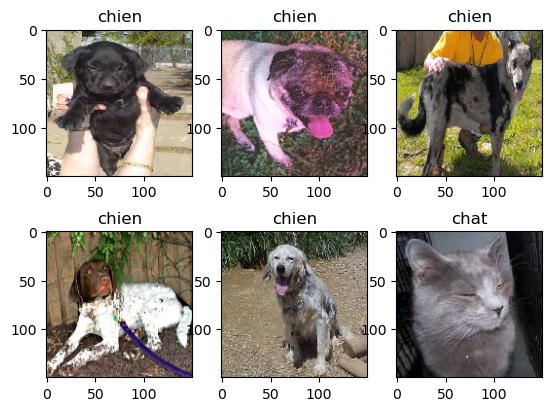

In [15]:
# Affichage de quelques images pour vérifier le prétraitement
for data_batch, labels_batch in train_generator:
    print("Taille du lot de données :", data_batch.shape) # Affiche la forme du lot
    print("Taille du lot d'étiquettes :", data_batch.shape) # Affiche la forme du
    for i in range(6):
        plt.subplot(2, 3, i +1)
        plt.imshow(data_batch[i]) # Affiche l'image prétraitée
        plt.title("chat" if labels_batch[i] == 0 else "chien") 
    plt.show()
    break  # Affiche un seul lot d'images



Premier modele avec 1500 images aléatoires

In [16]:
from tensorflow.keras import layers, models

model_1 = models.Sequential()

# Couche de convolution : 32 filtres de 3x3, détecte ddes motifs simples dans l'image,
# ReLU pour reendre le modele non-linéaire, forme d'entrée (150x150x3).
model_1.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 3)))
model_1.add(layers.MaxPooling2D((2, 2)))
model_1.add(layers.Conv2D(64, (3, 3), activation='relu'))

model_1.add(layers.MaxPooling2D((2, 2)))

model_1.add(layers.Conv2D(128, (3, 3), activation='relu'))

model_1.add(layers.MaxPooling2D((2, 2)))

model_1.add(layers.Flatten())


model_1.add(layers.Dense(512, activation='relu'))

model_1.add(layers.Dense(1, activation='sigmoid'))

C:\Users\JUNIOR JKB\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


model_1.summary()

In [17]:
from keras import optimizers

optimi = optimizers.RMSprop(learning_rate=1e-4)
model_1.compile(optimizer=optimi,
                loss='binary_crossentropy',
                metrics=['accuracy'])

In [18]:
# Entrainement du modele et sauvegarde de l'historique d'entrainement dans 'history'
history = model_1.fit(
    train_generator, 

    steps_per_epoch=train_generator.samples // train_generator.batch_size,

    epochs=30, # Nombre total d'époques pour l'entrainement

    validation_data=validation_generator,


    validation_steps=validation_generator.samples // validation_generator.batch_size
)

Epoch 1/30
75/75 ━━━━━━━━━━━━━━━━━━━━ 67s 850ms/step - accuracy: 0.6229 - loss: 0.6523 - val_accuracy: 0.0000e+00 - val_loss: 1.0108
Epoch 2/30
75/75 ━━━━━━━━━━━━━━━━━━━━ 55s 726ms/step - accuracy: 0.6383 - loss: 0.6216 - val_accuracy: 0.1667 - val_loss: 0.9005
Epoch 3/30
75/75 ━━━━━━━━━━━━━━━━━━━━ 54s 713ms/step - accuracy: 0.6587 - loss: 0.5997 - val_accuracy: 0.2934 - val_loss: 0.8319
Epoch 4/30
75/75 ━━━━━━━━━━━━━━━━━━━━ 53s 705ms/step - accuracy: 0.6808 - loss: 0.5743 - val_accuracy: 0.5920 - val_loss: 0.6743
Epoch 5/30
75/75 ━━━━━━━━━━━━━━━━━━━━ 53s 700ms/step - accuracy: 0.7138 - loss: 0.5421 - val_accuracy: 0.5990 - val_loss: 0.6866
Epoch 6/30
75/75 ━━━━━━━━━━━━━━━━━━━━ 55s 728ms/step - accuracy: 0.7275 - loss: 0.5170 - val_accuracy: 0.7309 - val_loss: 0.5730
Epoch 7/30
75/75 ━━━━━━━━━━━━━━━━━━━━ 52s 693ms/step - accuracy: 0.7462 - loss: 0.4961 - val_accuracy: 0.4965 - val_loss: 0.7836
Epoch 8/30
75/75 ━━━━━━━━━━━━━━━━━━━━ 53s 702ms/step - accuracy: 0.7650 - loss: 0.4744 - val_

In [19]:
# Evaluer les performances du modele sur la base de validation
validation_steps = validation_generator.samples // validation_generator.batch_size
evaluation = model_1.evaluate(validation_generator, steps=validation_steps)

# Afficher les résultats de l'évaluation
print(f"Perte sur la validation: {evaluation[0]}")
print(f"Précision sur la validation: {evaluation[1]}")

18/18 ━━━━━━━━━━━━━━━━━━━━ 4s 213ms/step - accuracy: 0.6476 - loss: 1.3019
Perte sur la validation: 1.301896572113037
Précision sur la validation: 0.6475694179534912


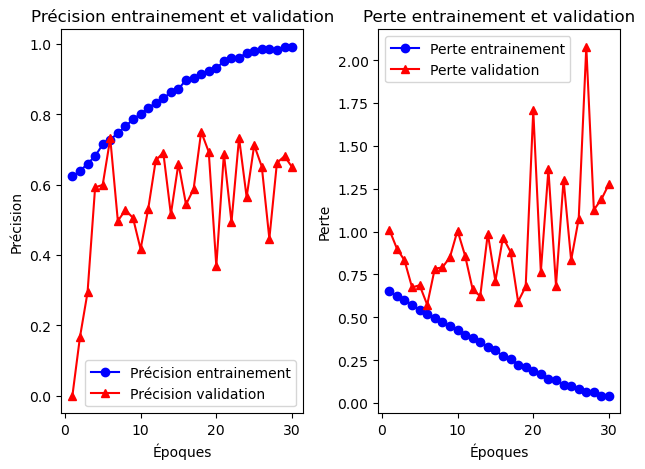

In [20]:
# prompt: history

# Récupérer les données de l'historique
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) +1)


# Tracer la courbe de précision
plt.subplot(1, 2, 1)
plt.plot(epochs, acc, 'bo-', label='Précision entrainement') # 'bo-'
plt.plot(epochs, val_acc, 'r^-', label='Précision validation') # 'r^-'
plt.title('Précision entrainement et validation')
plt.xlabel('Époques')
plt.ylabel('Précision')
plt.legend()

# Tracer la courbe de perte
plt.subplot(1, 2, 2)
plt.plot(epochs, loss, 'bo-', label='Perte entrainement') # 'bo-'
plt.plot(epochs, val_loss, 'r^-', label='Perte validation') # 'r^-'
plt.title('Perte entrainement et validation')
plt.xlabel('Époques')
plt.ylabel('Perte')
plt.legend()

plt.tight_layout()
plt.show()

In [21]:
from keras.models import load_model

# Chemin ou vous voulez sauvergarder vortre modele
save_path = 'cats_and_dogs_model_1.h5'

# Supposons que 'model' est votre modele que vous avez entrainé
model_1.save(save_path)

print(f"Modèle sauvegardé à l'emplacement : {save_path}")

Modèle sauvegardé à l'emplacement : cats_and_dogs_model_1.h5


In [22]:
import pandas as pd 
import matplotlib.pyplot as plt
# Charger le modele sauvergardé
from keras.utils import load_img, img_to_array

# Charger le modele sauvergardé
model_1 = load_model('cats_and_dogs_model_1.h5')

# Sélectionner aléatoirement 10 images de chats (categorie 0)
chats_df = df[df['category'] == 0].sample(n=10, random_state=42)

# Sélectionner aléatoirement 10 images de chiens (categorie 0)
chiens_df = df[df['category'] == 1].sample(n=10, random_state=42)

# Combiner les deux DataFrames
df_final = pd.concat([chats_df, chiens_df]).reset_index(drop=True)

# S'assurer que la colonne 'category' contient des chaines de carateres
df_final['category'] = df_final['category'].astype(str)

In [23]:
# Générateur pour les données de test
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_dataframe(
    df_final,
    directory="dogs-vs-cats/train",
    x_col='filename',
    y_col='category',
    target_size=(150, 150),
    batch_size=10,
    class_mode='binary',
    shuffle=False # Ne pas mélanger les donnés de test
)

# Faire des preédictions
predictions = model_1.predict(test_generator)

Found 20 validated image filenames belonging to 2 classes.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step 


In [24]:
# Convertir les prédictions en classes (0 ou 1)
predicted_classes = (predictions > 0.5).astype(int).flatten()

# Ajouter les prédictions au DataFrame
df_final['predictions'] = predicted_classes
df_final

,filename,category,predictions
0,cat.11587.jpg,0,1
1,cat.7585.jpg,0,0
2,cat.6767.jpg,0,0
3,cat.3214.jpg,0,1
4,cat.7839.jpg,0,0
5,cat.12476.jpg,0,1
6,cat.132.jpg,0,0
7,cat.376.jpg,0,1
8,cat.9255.jpg,0,0
9,cat.3949.jpg,0,0


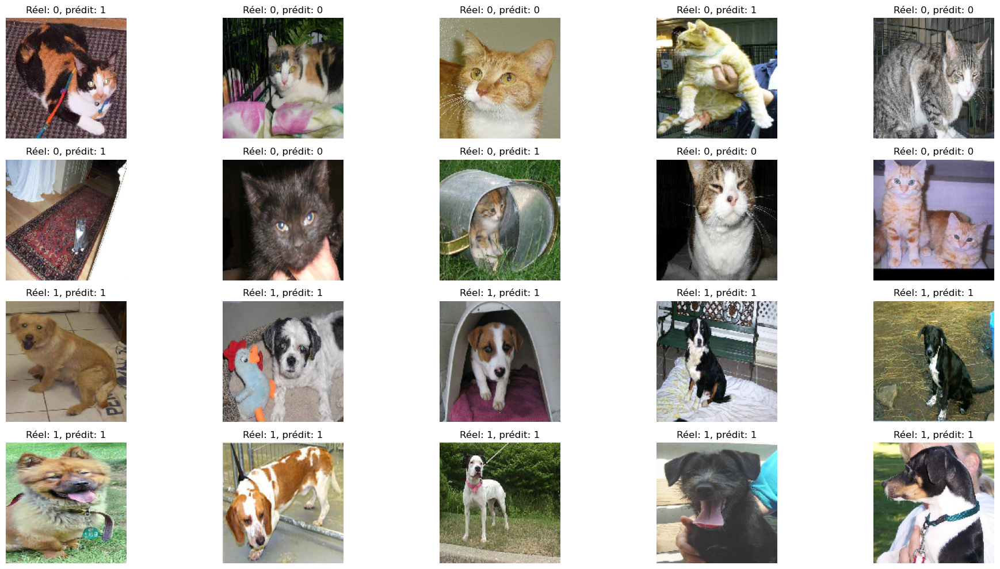

In [25]:
# Afficher les résultats pour les 20 images (10 chats et 10 chiens)
plt.figure(figsize=(20, 10))
for i, row in df_final.iterrows():
    img_path = f"dogs-vs-cats/train/{row['filename']}"
    img = load_img(img_path, target_size=(150, 150))
    plt.subplot(4, 5, i +1)
    plt.imshow(img)
    plt.title(f"Réel: {row['category']}, prédit: {row['predictions']}")
    plt.axis('off')

plt.tight_layout()
plt.show()

Cellule importante : Prédiction avec des noms (chien ou chat)

In [26]:
import os 
import cv2
import numpy as np
from tensorflow.keras.models import load_model

model_1 = load_model('cats_and_dogs_model_1.h5')

test_dir="dogs-vs-cats/test"
img_size = (150, 150) # taille correspondant a l'entrée de ton CNN

def predict_image(img):
    #Redimensinner
    img_resized = cv2.resize(img, img_size)
    
    # Normaliser
    img_norm = img_resized.astype("float32") / 255.0
    
    # ajouter la dimension batch
    img_input = np.expand_dims(img_norm, axis=0)

    # Prediction
    proba = model_1.predict(img_input,verbose=0)[0][0]

    # Classe
    label = "CHAT" if proba < 0.5 else "CHIEN"
    return label, proba

# Afficher 20 images 
import matplotlib.pyplot as plt

files = os.listdir(test_dir)

plt.figure(figsize=(15,10))

for i, file in enumerate(files[:20]):
    img_path = os.path.join(test_dir, file)
    img = cv2.imread(img_path)
    
    if img is None:
        continue

        label, proba = predict_image(img)

        # OpenCV → RGB
        img_rgb = cv2.cvtcolor(img, cv2.COLOR_BGR2RGB)

        plt.subplot(4, 5, i+1)
        plt.imshow(img_rgb)
        plt.title(f"{label} ({proba:.2f})")
        plt.axis("off")

plt.tight_layout()
plt.show()


<Figure size 1500x1000 with 0 Axes>

Prédiction avec une camera en temps réel

In [27]:
import cv2
import numpy as np
from tensorflow.keras.models import load_model
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

# Charger le modèle sauvegardé
model_1 = load_model('cats_and_dogs_model_1.h5')

img_size = (150, 150)

# Initialisation caméra
cap = cv2.VideoCapture(0)

if not cap.isOpened():
    print("Impossible d'ouvrir la camera")
    exit()

print("Appuyez sur 'q' pour quitter")

# Boucle temps réel
while True:
    ret, frame = cap.read()
    if not ret:
        print("Erreur de capture")
        break

    # Redimensionner pour le CNN
    img_resized = cv2.resize(frame, img_size)

    # Convertir en float32
    img_resized = img_resized.astype("float32")

    # Pré-traitement MobileNetV2
    img_prepared = preprocess_input(img_resized)

    # Ajouter dimension batch
    img_input = np.expand_dims(img_prepared, axis=0)

    # Prédiction CNN
    proba = model_1.predict(img_input, verbose=0)[0][0]

    if proba < 0.3:
        label = f"CHAT ({1 - proba:.2f})"
    elif proba > 0.7:
        label = f"CHIEN ({proba:.2f})"
    else:
        label = "INCONNU"

    # Affichage du résultat sur l'image
    cv2.putText(
        frame,
        label,
        (20, 40),
        cv2.FONT_HERSHEY_SIMPLEX,
        1,
        (0, 255, 0),
        2
    )

    # Afficher la fenêtre
    cv2.imshow("Detection Chat vs Chien", frame)

    # Quitter avec la touche q
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# Libération des ressources
cap.release()
cv2.destroyAllWindows()


Appuyez sur 'q' pour quitter


In [28]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

IMG_SIZE = (150, 150)
BATCH_SIZE = 32

# Création du générateur de données avec augmentation
datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2,
    rotation_range=30,
    zoom_range=0.2,
    horizontal_flip=True
)


In [30]:
# 🔹 Convertir la colonne class en string (OBLIGATOIRE pour class_mode='binary')
train_df['class'] = train_df['class'].astype(str)

# 🔹 Générateur d'entraînement
train_generator = datagen.flow_from_dataframe(
    dataframe=train_df,
    directory=train_dir,
    x_col='filename',
    y_col='class',
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='binary',
    subset='training'
)

# 🔹 Générateur de validation
validation_generator = datagen.flow_from_dataframe(
    dataframe=train_df,
    directory=train_dir,
    x_col='filename',
    y_col='class',
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='binary',
    subset='validation'
)


Found 20000 validated image filenames belonging to 2 classes.


C:\Users\JUNIOR JKB\anaconda3\Lib\site-packages\keras\src\legacy\preprocessing\image.py:918: UserWarning: Found 1 invalid image filename(s) in x_col="filename". These filename(s) will be ignored.
  warnings.warn(


Found 5000 validated image filenames belonging to 2 classes.


C:\Users\JUNIOR JKB\anaconda3\Lib\site-packages\keras\src\legacy\preprocessing\image.py:918: UserWarning: Found 1 invalid image filename(s) in x_col="filename". These filename(s) will be ignored.
  warnings.warn(


Générateur test(sans augmentation)

In [49]:
# 🔹 Convertir en string (OBLIGATOIRE pour binary)
test_df['class'] = test_df['class'].astype(str)

test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    directory=test_dir,
    x_col="filename",
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode=None,
    shuffle=False
)


Found 12500 validated image filenames.


Création du modele CNN

In [38]:
from tensorflow.keras import models, layers
from tensorflow.keras.callbacks import EarlyStopping

model = models.Sequential([

    layers.Input(shape=(150, 150, 3)),

    # 🔹 Bloc 1
    layers.Conv2D(32, (3, 3), strides=(2, 2), padding="valid"),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.25),

    # 🔹 Bloc 2
    layers.Conv2D(64, (3, 3), strides=(2, 2), padding="valid"),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.25),

    # 🔹 Bloc 3
    layers.Conv2D(128, (3, 3), strides=(2, 2), padding="valid"),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.25),

    # 🔹 Classification
    layers.Flatten(),
    layers.Dense(512),
    layers.BatchNormalization(),
    layers.Activation('relu'),
    layers.Dropout(0.5),

    layers.Dense(1, activation='sigmoid')
])

model.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy']
)


Mécanisme d'arret en cas de non amélioration de la perte de validation

In [39]:
early_stop = EarlyStopping(
     monitor="val_loss",
     patience=5,
     restore_best_weights=True,
     verbose=1
)

Entrainement

In [41]:
history = model.fit(
    train_generator,
    epochs=30,
    validation_data=validation_generator,
    callbacks=[early_stop]
)

Epoch 1/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 358s 573ms/step - accuracy: 0.7327 - loss: 0.5251 - val_accuracy: 0.4406 - val_loss: 0.8732
Epoch 2/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 348s 557ms/step - accuracy: 0.7504 - loss: 0.4983 - val_accuracy: 0.7868 - val_loss: 0.4782
Epoch 3/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 33468s 54s/step - accuracy: 0.7690 - loss: 0.4765 - val_accuracy: 0.7780 - val_loss: 0.5104
Epoch 4/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 442s 707ms/step - accuracy: 0.7775 - loss: 0.4649 - val_accuracy: 0.7476 - val_loss: 0.5456
Epoch 5/30
625/625 ━━━━━━━━━━━━━━━━━━━━ 594s 952ms/step - accuracy: 0.7879 - loss: 0.4484 - val_accuracy: 0.8702 - val_loss: 0.3235
Epoch 5: early stopping
Restoring model weights from the end of the best epoch: 1.


Sauvegarde du Modele

In [42]:
model.save("dogs_vs_cats_cnn.keras")
import pandas as pd

df_history = pd.DataFrame(history.history)
df_history.to_csv("history.csv", index=False)

print("History sauvegardé en CSV !")


History sauvegardé en CSV !


Chargement du Modele

In [44]:
from tensorflow.keras.models import load_model

model = load_model("dogs_vs_cats_cnn.keras")

print("Modèle rechargé avec succès !")

Modèle rechargé avec succès !


In [45]:
import pandas as pd
df = pd.read_csv("history.csv")
print(df.head())

   accuracy      loss  val_accuracy  val_loss
0   0.73270  0.525109        0.4406  0.873175
1   0.75040  0.498306        0.7868  0.478161
2   0.76900  0.476461        0.7780  0.510405
3   0.77750  0.464851        0.7476  0.545632
4   0.78795  0.448394        0.8702  0.323520


Evaluation sur test

In [50]:
# 🔹 Faire les prédictions
predictions = model.predict(test_generator)

# 🔹 Afficher les résultats
for i, pred in enumerate(predictions):
    label = "Chien" if pred > 0.5 else "Chat"
    print(f"{test_generator.filenames[i]} → {label} ({pred[0]:.4f})")


391/391 ━━━━━━━━━━━━━━━━━━━━ 72s 182ms/step
1.jpg → Chien (0.7868)
10.jpg → Chat (0.3889)
100.jpg → Chien (0.5858)
1000.jpg → Chien (0.9446)
10000.jpg → Chien (0.8408)
10001.jpg → Chien (0.5469)
10002.jpg → Chat (0.0734)
10003.jpg → Chien (0.9304)
10004.jpg → Chien (0.8123)
10005.jpg → Chat (0.3501)
10006.jpg → Chat (0.1907)
10007.jpg → Chat (0.2609)
10008.jpg → Chien (0.5608)
10009.jpg → Chat (0.3576)
1001.jpg → Chien (0.9405)
10010.jpg → Chien (0.9798)
10011.jpg → Chien (0.7435)
10012.jpg → Chien (0.5333)
10013.jpg → Chien (0.6189)
10014.jpg → Chat (0.2088)
10015.jpg → Chien (0.8645)
10016.jpg → Chien (0.7312)
10017.jpg → Chat (0.3389)
10018.jpg → Chat (0.2331)
10019.jpg → Chat (0.3540)
1002.jpg → Chien (0.9683)
10020.jpg → Chat (0.4846)
10021.jpg → Chien (0.5363)
10022.jpg → Chien (0.7162)
10023.jpg → Chien (0.8664)
10024.jpg → Chien (0.6759)
10025.jpg → Chien (0.5040)
10026.jpg → Chien (0.6541)
10027.jpg → Chien (0.8776)
10028.jpg → Chat (0.4587)
10029.jpg → Chien (0.7905)
1003.jpg

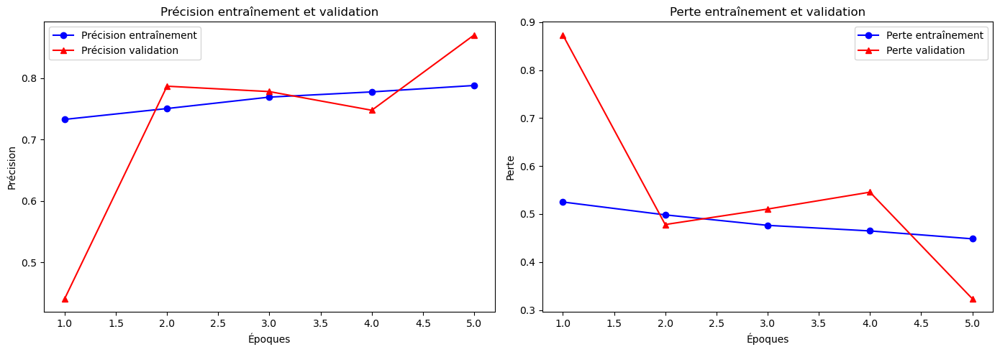

In [51]:
import matplotlib.pyplot as plt

# 🔹 Récupérer les données de l'historique
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

# 🔹 Tracer la courbe de précision
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.plot(epochs, acc, 'bo-', label='Précision entraînement')   # bleu
plt.plot(epochs, val_acc, 'r^-', label='Précision validation') # rouge
plt.title('Précision entraînement et validation')
plt.xlabel('Époques')
plt.ylabel('Précision')
plt.legend()

# 🔹 Tracer la courbe de perte
plt.subplot(1, 2, 2)
plt.plot(epochs, loss, 'bo-', label='Perte entraînement')      # bleu
plt.plot(epochs, val_loss, 'r^-', label='Perte validation')    # rouge
plt.title('Perte entraînement et validation')
plt.xlabel('Époques')
plt.ylabel('Perte')
plt.legend()

plt.tight_layout()
plt.show()


Vision par ordinateur(image → classe)

In [52]:
import os
import cv2
import numpy as np
from tensorflow.keras.models import load_model

# 🔹 Charger le modèle CNN entraîné
cnn_model = load_model("dogs_vs_cats_cnn.keras")

test_dir = "dogs-vs-cats/test"
img_size = (150, 150)  # taille correspondant à l'entrée de ton CNN

# 🔹 Fonction de prédiction pour une image
def predict_one_image(path):
    # Lire l'image
    img = cv2.imread(path)
    if img is None:
        return None

    # Redimensionner
    img = cv2.resize(img, img_size)

    # Normaliser [0,255] -> [0,1]
    img = img.astype("float32") / 255.0

    # Ajouter une dimension batch (1, H, W, C)
    img = np.expand_dims(img, axis=0)

    # Prédiction CNN
    pred = cnn_model.predict(img, verbose=0)[0][0]

    # Retourner la classe
    return "CHAT" if pred < 0.5 else "CHIEN"


# 🔹 Tester 20 images
files = os.listdir(test_dir)

print("Test de 20 images :\n")

for i, file in enumerate(files[:20]):  # prend les 20 premières
    img_path = os.path.join(test_dir, file)
    result = predict_one_image(img_path)

    if result is not None:
        print(f"{file} → {result}")


Test de 20 images :

1.jpg → CHIEN
10.jpg → CHIEN
100.jpg → CHIEN
1000.jpg → CHIEN
10000.jpg → CHIEN
10001.jpg → CHIEN
10002.jpg → CHIEN
10003.jpg → CHIEN
10004.jpg → CHIEN
10005.jpg → CHIEN
10006.jpg → CHIEN
10007.jpg → CHAT
10008.jpg → CHIEN
10009.jpg → CHIEN
1001.jpg → CHIEN
10010.jpg → CHIEN
10011.jpg → CHIEN
10012.jpg → CHIEN
10013.jpg → CHIEN
10014.jpg → CHIEN


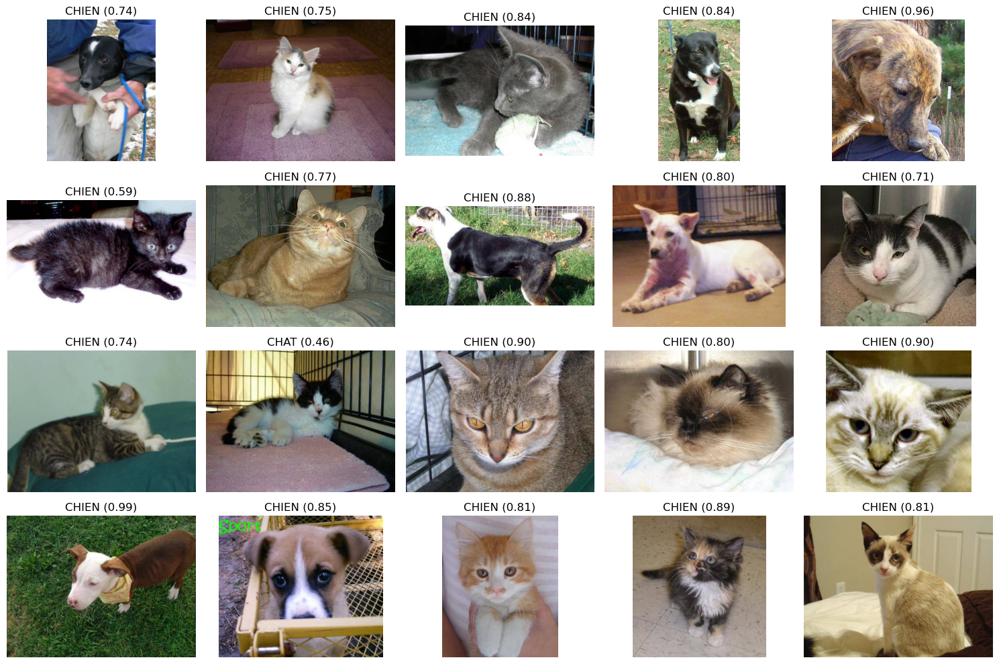

In [53]:
def predict_image(img):
    # Redimensionner
    img_resized = cv2.resize(img, img_size)

    # Normaliser
    img_norm = img_resized.astype("float32") / 255.0

    # Ajouter la dimension batch
    img_input = np.expand_dims(img_norm, axis=0)

    # Prédiction
    proba = cnn_model.predict(img_input, verbose=0)[0][0]

    # Classe
    label = "CHAT" if proba < 0.5 else "CHIEN"

    return label, proba


# Afficher 20 images
import matplotlib.pyplot as plt
import os

files = os.listdir(test_dir)

plt.figure(figsize=(15, 10))

for i, file in enumerate(files[:20]):
    img_path = os.path.join(test_dir, file)
    img = cv2.imread(img_path)

    if img is None:
        continue

    label, proba = predict_image(img)

    # OpenCV → RGB
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(4, 5, i+1)
    plt.imshow(img_rgb)
    plt.title(f"{label} ({proba:.2f})")
    plt.axis("off")

plt.tight_layout()
plt.show()


In [69]:
import os
import pandas as pd
from keras.models import load_model
from keras.utils import load_img, img_to_array

# Charger le modèle sauvegardé
model = load_model('dogs_vs_cats_cnn.keras')

# Chemin du dossier train
image_folder = "dogs-vs-cats/train/"  # ⚠️ adapte le chemin selon ton projet

# Vérifier que le dossier existe
if not os.path.exists(image_folder):
    raise FileNotFoundError(f"Le dossier '{image_folder}' n'existe pas.")

# Lister tous les fichiers du dossier
all_images = os.listdir(image_folder)

# Vérifier qu'il y a bien des fichiers
if len(all_images) == 0:
    raise ValueError(f"Aucune image trouvée dans le dossier '{image_folder}'.")

# Créer le DataFrame
df = pd.DataFrame(all_images, columns=['filename'])

# Créer la colonne 'category' : 0 = chat, 1 = chien
df['category'] = df['filename'].apply(lambda x: 0 if 'cat' in x.lower() else 1)

# Vérifier qu’il y a au moins 10 chats et 10 chiens
if len(df[df['category'] == 0]) < 10 or len(df[df['category'] == 1]) < 10:
    raise ValueError("Il n'y a pas assez d'images de chats ou de chiens pour en sélectionner 10.")

# Sélectionner aléatoirement 10 chats et 10 chiens
chats_df = df[df['category'] == 0].sample(n=10, random_state=42)
chiens_df = df[df['category'] == 1].sample(n=10, random_state=42)

# Combiner les deux DataFrames
df_final = pd.concat([chats_df, chiens_df]).reset_index(drop=True)

# Convertir 'category' en chaîne de caractères (optionnel)
df_final['category'] = df_final['category'].astype(str)

# Afficher le DataFrame final
print(df_final)


         filename category
0   cat.11587.jpg        0
1    cat.9476.jpg        0
2    cat.6767.jpg        0
3    cat.3214.jpg        0
4    cat.7838.jpg        0
5   cat.12476.jpg        0
6     cat.132.jpg        0
7     cat.376.jpg        0
8    cat.9254.jpg        0
9    cat.3949.jpg        0
10  dog.11587.jpg        1
11   dog.7585.jpg        1
12   dog.6767.jpg        1
13   dog.3214.jpg        1
14   dog.7839.jpg        1
15  dog.12476.jpg        1
16    dog.132.jpg        1
17    dog.376.jpg        1
18   dog.9255.jpg        1
19   dog.3949.jpg        1


In [70]:
# Générer pour les données de test
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_dataframe(
    df_final,
    directory="dogs-vs-cats/train",
    x_col='filename',
    y_col='category',
    target_size=(150, 150),
    batch_size=10,
    class_mode='binary',
    shuffle=False  # Ne pas mélanger les données de test
)

# Faire des prédictions
predictions = cnn_model.predict(test_generator)

Found 20 validated image filenames belonging to 2 classes.
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step


In [71]:
# Convertir les prédictions en classes (0 ou 1)
predicted_classes = (predictions > 0.5).astype(int).flatten()

# Ajouter les prédictions au DataFrame
df_final['predictions'] = predicted_classes
df_final

,filename,category,predictions
0,cat.11587.jpg,0,1
1,cat.9476.jpg,0,0
2,cat.6767.jpg,0,0
3,cat.3214.jpg,0,1
4,cat.7838.jpg,0,0
5,cat.12476.jpg,0,1
6,cat.132.jpg,0,0
7,cat.376.jpg,0,1
8,cat.9254.jpg,0,1
9,cat.3949.jpg,0,1


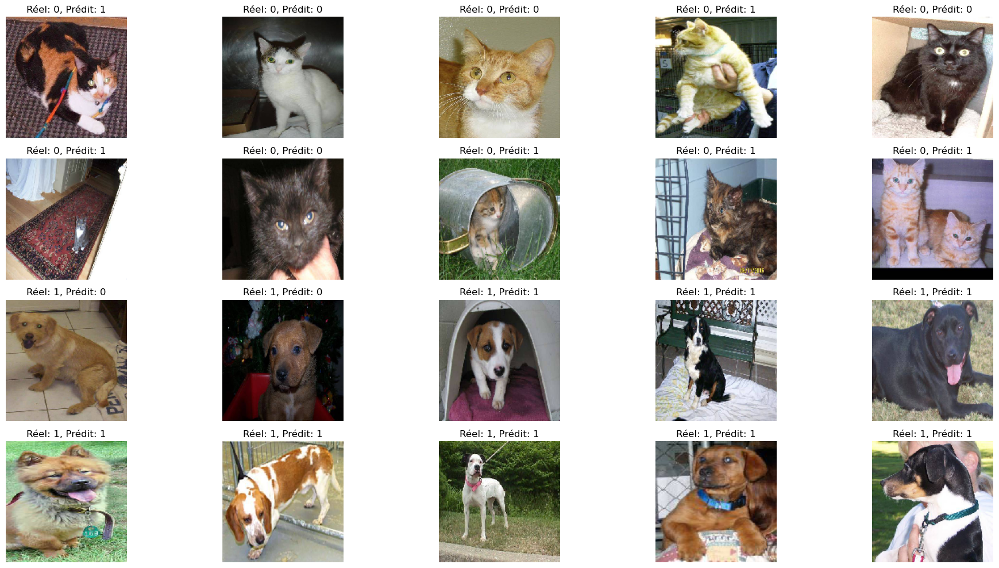

In [72]:
# Afficher les résultats pour les 20 images (10 chats et 10 chiens)
plt.figure(figsize=(20, 10))
for i, row in df_final.iterrows():
    img_path = f"dogs-vs-cats/train/{row['filename']}"
    img = load_img(img_path, target_size=(150, 150))
    plt.subplot(4, 5, i + 1)
    plt.imshow(img)
    plt.title(f"Réel: {row['category']}, Prédit: {row['predictions']}")
    plt.axis('off')

plt.tight_layout()
plt.show()

Transfer-learning

In [73]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import layers, models, optimizers

# Base pré-entraîné (ImageNet)
base_model = MobileNetV2(
    weights="imagenet",
    include_top=False,
    input_shape=(150, 150, 3)
)

# Geler les poids (feature extractor)
base_model.trainable = False

# Tête de classification
model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.BatchNormalization(),
    layers.Dense(128, activation="relu"),
    layers.Dropout(0.5),
    layers.Dense(1, activation="sigmoid")
])

model.compile(
    optimizer=optimizers.Adam(learning_rate=1e-4),
    loss="binary_crossentropy",
    metrics=["accuracy"]
)

model.summary()

C:\Users\JUNIOR JKB\AppData\Local\Temp\ipykernel_1432\1002606793.py:5: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 269s 29us/step


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224            │ (None, 5, 5, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_8           │ (None, 1280)           │         5,120 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,427,201 (9.26 MB)

 Trainable params: 166,657 (651.00 KB)

 Non-trainable params: 2,260,544 (8.62 MB)

EarlyStopping

In [75]:
from tensorflow.keras.callbacks import EarlyStopping

early_stop = EarlyStopping(
    monitor="val_loss",
    patience=5,
    restore_best_weights=True
)

Entrainement

In [76]:
history = model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=10,
    callbacks=[early_stop]
)

Epoch 1/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 607s 951ms/step - accuracy: 0.8902 - loss: 0.2580 - val_accuracy: 0.9216 - val_loss: 0.1759
Epoch 2/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 477s 764ms/step - accuracy: 0.9268 - loss: 0.1781 - val_accuracy: 0.9256 - val_loss: 0.1777
Epoch 3/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 503s 805ms/step - accuracy: 0.9340 - loss: 0.1574 - val_accuracy: 0.9262 - val_loss: 0.1758
Epoch 4/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 505s 808ms/step - accuracy: 0.9369 - loss: 0.1471 - val_accuracy: 0.9196 - val_loss: 0.1874
Epoch 5/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 533s 853ms/step - accuracy: 0.9376 - loss: 0.1484 - val_accuracy: 0.9318 - val_loss: 0.1648
Epoch 6/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 493s 787ms/step - accuracy: 0.9421 - loss: 0.1397 - val_accuracy: 0.9276 - val_loss: 0.1725
Epoch 7/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 527s 843ms/step - accuracy: 0.9433 - loss: 0.1359 - val_accuracy: 0.9368 - val_loss: 0.1585
Epoch 8/10
625/625 ━━━━━━━━━━━━━━━━━━━━ 519s 829ms/step - accuracy: 0.9444 -

Sauvagardedu model

In [77]:
import pandas as pd
model.save("dogs_vs_cats_mobilenetv2.h5")

df_history = pd.DataFrame(history.history)
df_history.to_csv("history_dogs_vs_cats_mobilenetv2.csv", index=False)

In [78]:
import pandas as pd
df = pd.read_csv("history_dogs_vs_cats_mobilenetv2.csv")
print(df.head())

   accuracy      loss  val_accuracy  val_loss
0   0.89015  0.258022        0.9216  0.175866
1   0.92680  0.178102        0.9256  0.177715
2   0.93395  0.157372        0.9262  0.175768
3   0.93685  0.147121        0.9196  0.187448
4   0.93760  0.148353        0.9318  0.164755


Chargelent du modele

In [83]:
from tensorflow.keras.models import load_model

model_mobilnet = load_model("dogs_vs_cats_mobilenetv2.h5")

Prédiction sans caméra

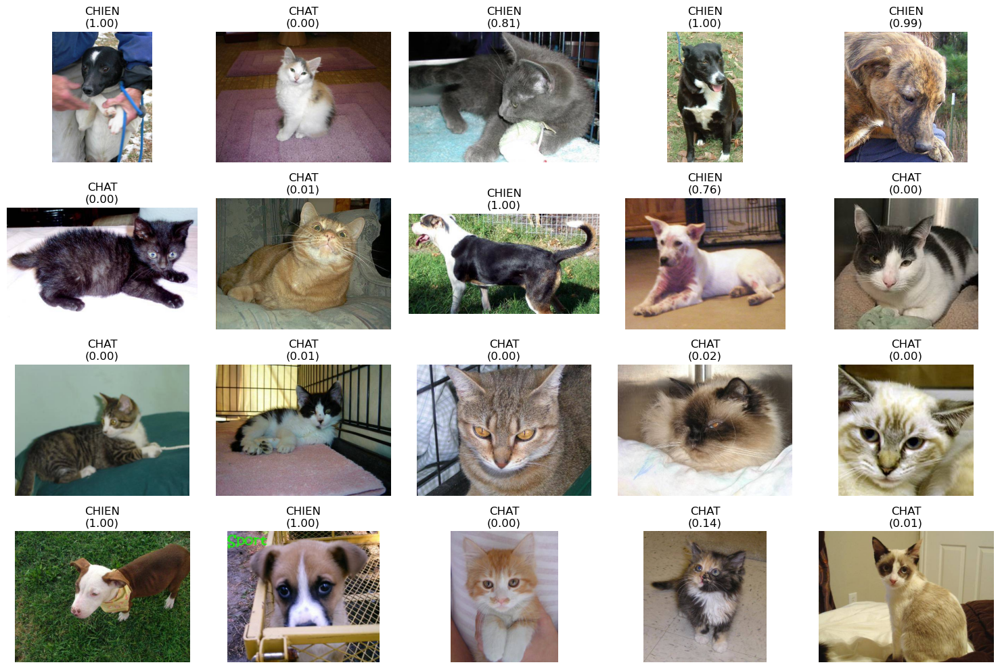

In [85]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# 1. Paramètres
img_size = (150, 150)
test_dir = "dogs-vs-cats/test"

# 2. Charger le modèle (TRÈS IMPORTANT: À FAIRE AVANT LA FONCTION)
model_mobilenet = load_model("dogs_vs_cats_mobilenetv2.h5")

# 3. Définir la fonction (MAINTENANT model_mobilenet est défini)
def predict_image(img):
    img_resized = cv2.resize(img, img_size)
    img_norm = img_resized.astype("float32") / 255.0
    img_input = np.expand_dims(img_norm, axis=0)
    proba = model_mobilenet.predict(img_input, verbose=0)[0][0]
    label = "CHAT" if proba < 0.5 else "CHIEN"
    return label, proba

# 4. Afficher les images
files = os.listdir(test_dir)[:20]
plt.figure(figsize=(15, 10))

for i, file in enumerate(files):
    img_path = os.path.join(test_dir, file)
    img = cv2.imread(img_path)
    
    if img is None:
        continue
        
    label, proba = predict_image(img)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    plt.subplot(4, 5, i+1)
    plt.imshow(img_rgb)
    plt.title(f"{label}\n({proba:.2f})")
    plt.axis('off')

plt.tight_layout()
plt.show()

Test avec caméra TEMPS REEL avec CNN pré-entrainé

In [94]:
# Charger le modèle CNN pré-entraîné
import cv2
import numpy as np
from tensorflow.keras.models import load_model
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

cnn_model = load_model("dogs_vs_cats_mobilenetv2.h5")

img_size = (150, 150)

# Initialisation caméra
cap = cv2.VideoCapture(0)

if not cap.isOpened():
    print("Impossible d'ouvrir la caméra")
    exit()

print("Appuyez sur 'q' pour quitter")

# Boucle temps réel
while True:
    ret, frame = cap.read()
    if not ret:
        print("Erreur de capture")
        break

    # Redimensionner pour le CNN
    img_resized = cv2.resize(frame, img_size)

    # Pré-traitement MobileNetV2
    img_prepared = preprocess_input(img_resized.astype("float32"))

    # Ajouter dimension batch
    img_input = np.expand_dims(img_prepared, axis=0)

    # Prédiction CNN
    proba = cnn_model.predict(img_input, verbose=0)[0][0]

    if proba < 0.3:
        label = f"CHAT ({1-proba:.2f})"
    elif proba > 0.7:
        label = f"CHIEN ({proba:.2f})"
    else:
        label = "INCONNU"

    # Affichage du résultat
    cv2.putText(
        frame,
        label,
        (20, 40),
        cv2.FONT_HERSHEY_SIMPLEX,
        1,
        (0, 255, 0),
        2
    )

    cv2.imshow("Prediction CNN (MobileNetV2)", frame)

    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# Libération ressources
cap.release()
cv2.destroyAllWindows()

Appuyez sur 'q' pour quitter


Data augmentation

In [86]:
# Création de l'objet ImageDataGenerator avec data augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,                    # Normalise les pixels entre 0 et 1
    rotation_range=40,                  # Rotation aléatoire des images jusqu'à 40 degrés
    width_shift_range=0.2,              # Translation horizontale aléatoire jusqu'à 20% de la largeur
    height_shift_range=0.2,             # Translation verticale aléatoire jusqu'à 20% de la hauteur
    shear_range=0.2,                    # Cisaillement aléatoire
    zoom_range=0.2,                      # Zoom aléatoire sur les images
    horizontal_flip=True,                # Flip horizontal des images
    fill_mode='nearest'                  # Remplissage des pixels manquants après transformation
)

In [87]:
from sklearn.model_selection import train_test_split

# Diviser les données en ensembles d'entraînement et de test
df_train, df_test = train_test_split(df_final, test_size=0.2, random_state=42)

# Afficher la taille des ensembles d'entraînement et de test
print(f"Taille de l'ensemble d'entraînement : {df_train.shape[0]}")
print(f"Taille de l'ensemble de test : {df_test.shape[0]}")

Taille de l'ensemble d'entraînement : 16
Taille de l'ensemble de test : 4


In [88]:
from tensorflow.keras.utils import load_img, img_to_array
import matplotlib.pyplot as plt
import numpy as np

# Chemin vers le répertoire contenant les images de chat et de chien
image_path = 'dogs-vs-cats/train/cat.0.jpg'  # Exemple d'image (corrigé l'extension)

# Charger et prétraiter l'image
img = load_img(image_path, target_size=(150, 150))
img_array = img_to_array(img) / 255.0

In [89]:
# Fonction pour afficher l'image originale et transformée
def plot_before_and_after(original, transformed, title):
    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.title('Original')
    plt.imshow(original)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title(title)
    plt.imshow(transformed)
    plt.axis('off')

    plt.show()

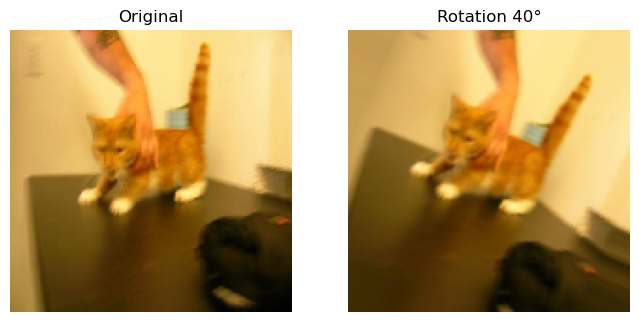

In [90]:
# Note: Les codes suivants contiennent des erreurs dans l'image originale
# Voici une version corrigée pour chaque transformation:

# Transformation de rotation
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np

# Créer un générateur avec rotation
rotation_datagen = ImageDataGenerator(rotation_range=40)

# Reshaper l'image pour le générateur (ajouter dimension batch)
img_batch = np.expand_dims(img_array, 0)

# Générer une image transformée
rotated_iter = rotation_datagen.flow(img_batch, batch_size=1)
rotated_img = next(rotated_iter)[0]

# Afficher
plot_before_and_after(img_array, rotated_img, "Rotation 40°")

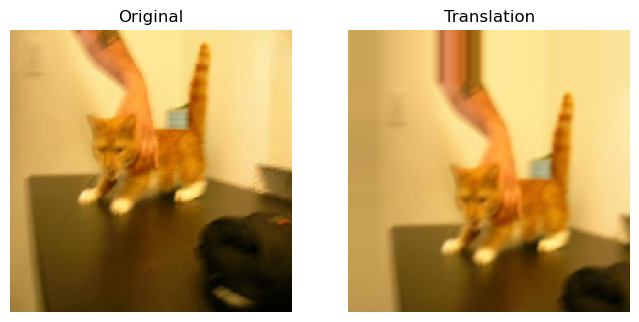

In [91]:
# Transformation de translation
translation_datagen = ImageDataGenerator(
    width_shift_range=0.2, 
    height_shift_range=0.2
)

img_batch = np.expand_dims(img_array, 0)
translated_iter = translation_datagen.flow(img_batch, batch_size=1)
translated_img = next(translated_iter)[0]

plot_before_and_after(img_array, translated_img, "Translation")

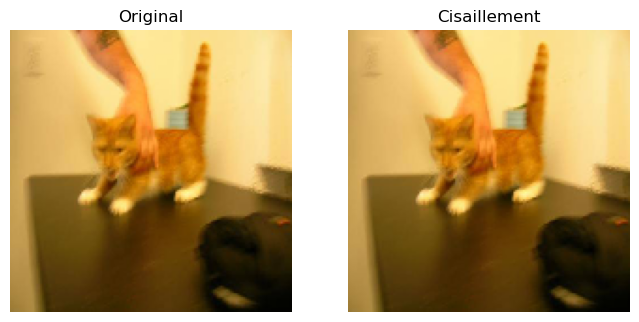

In [92]:
# Transformation de cisaillement
shear_datagen = ImageDataGenerator(shear_range=0.2)

img_batch = np.expand_dims(img_array, 0)
sheared_iter = shear_datagen.flow(img_batch, batch_size=1)
sheared_img = next(sheared_iter)[0]

plot_before_and_after(img_array, sheared_img, "Cisaillement")

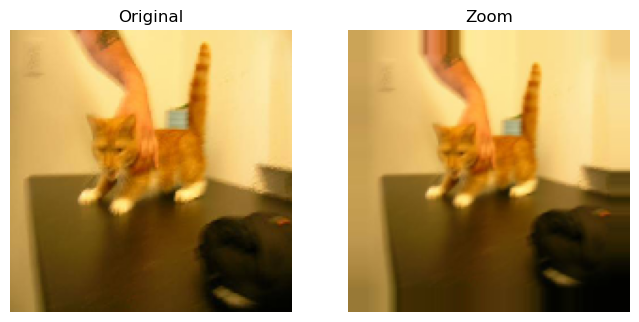

In [93]:
# Transformation de zoom
zoom_datagen = ImageDataGenerator(zoom_range=0.2)

img_batch = np.expand_dims(img_array, 0)
zoomed_iter = zoom_datagen.flow(img_batch, batch_size=1)
zoomed_img = next(zoomed_iter)[0]

plot_before_and_after(img_array, zoomed_img, "Zoom")